# Домашнее задание 3. 

## Предсказание пользовательской оценки отеля по тексту отзыва.

Мы собрали для вас отзывы по 1500 отелям из совершенно разных уголков мира. Что это за отели - секрет. Вам дан текст отзыва и пользовательская оценка отеля. Ваша задача - научиться предсказывать оценку отеля по отзыву. Данные можно скачать [тут](https://www.kaggle.com/c/hseds-texts-2020/data?select=train.csv).

Главная метрика - Mean Absolute Error (MAE). Во всех частях домашней работы вам нужно получить значение MAE не превышающее 1. В противном случае мы будем вынуждены не засчитать задание :( 

Для измерения качества вашей модели используйте разбиение данных на train и test и замеряйте качество на тестовой части.

#### Про данные:
Каждое ревью состоит из двух текстов: positive и negative - плюсы и минусы отеля. В столбце score находится оценка пользователя - вещественное число 0 до 10. Вам нужно извлечь признаки из этих текстов и предсказать по ним оценку.

Удачи! 💪

#### Использовать внешние данные для обучения строго запрещено. Можно использовать предобученные модели из torchvision.

In [2]:
PATH_TO_TRAIN_DATA = '/content/train.csv'

In [3]:
import pandas as pd

df = pd.read_csv(PATH_TO_TRAIN_DATA).fillna(' ')
df.head()

,review_id,negative,positive,score
0,00003c6036f30f590c0ac435efb8739b,There were issues with the wifi connection,No Positive,7.1
1,00004d18f186bf2489590dc415876f73,TV not working,No Positive,7.5
2,0000cf900cbb8667fad33a717e9b1cf4,More pillows,Beautiful room Great location Lovely staff,10.0
3,0000df16edf19e7ad9dd8c5cd6f6925e,Very business,Location,5.4
4,00025e1aa3ac32edb496db49e76bbd00,Rooms could do with a bit of a refurbishment ...,Nice breakfast handy for Victoria train stati...,6.7


In [4]:
df_clean = df.drop(df[(df.positive == 'No Positive' ) & (df.negative == 'No Negative')].index)
df = df_clean

Предобработка текста может сказываться на качестве вашей модели.
Сделаем небольшой препроцессинг текстов: удалим знаки препинания, приведем все слова к нижнему регистру. 
Однако можно не ограничиваться этим набором преобразований. Подумайте, что еще можно сделать с текстами, чтобы помочь будущим моделям? Добавьте преобразования, которые могли бы помочь по вашему мнению.

Также мы добавили разбиение текстов на токены. Теперь каждая строка-ревью стала массивом токенов.

In [5]:
import string

import nltk
nltk.download('punkt')

from nltk.tokenize import word_tokenize
from nltk.stem.porter import PorterStemmer
stemmer = PorterStemmer()

def process_text(text):
    tokens =  [word for word in word_tokenize(text.lower()) if word not in string.punctuation]
    stems = [stemmer.stem(item) for item in tokens]
    return stems

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [6]:
df['negative'] = df['negative'].apply(process_text)
df['positive'] = df['positive'].apply(process_text)

In [7]:
df['response'] = df.negative + df.positive

In [8]:
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(df)

### Часть 1. 1 балл

Обучите логистическую регрессию на TF-IDF векторах текстов.

In [9]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge 

In [10]:
from scipy.sparse import hstack
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
np.random.seed(9)

In [11]:
text_transformer = TfidfVectorizer()

In [12]:
df

,review_id,negative,positive,score,response
0,00003c6036f30f590c0ac435efb8739b,"[there, were, issu, with, the, wifi, connect]","[no, posit]",7.1,"[there, were, issu, with, the, wifi, connect, ..."
1,00004d18f186bf2489590dc415876f73,"[tv, not, work]","[no, posit]",7.5,"[tv, not, work, no, posit]"
2,0000cf900cbb8667fad33a717e9b1cf4,"[more, pillow]","[beauti, room, great, locat, love, staff]",10.0,"[more, pillow, beauti, room, great, locat, lov..."
3,0000df16edf19e7ad9dd8c5cd6f6925e,"[veri, busi]",[locat],5.4,"[veri, busi, locat]"
4,00025e1aa3ac32edb496db49e76bbd00,"[room, could, do, with, a, bit, of, a, refurbi...","[nice, breakfast, handi, for, victoria, train,...",6.7,"[room, could, do, with, a, bit, of, a, refurbi..."
...,...,...,...,...,...
99995,fffd2d3cf4eaa0db822b90c4a723cc29,"[no, coffe, facil, in, room, air, con, didn, t...","[veri, quiet, for, a, central, london, hotel, ...",7.9,"[no, coffe, facil, in, room, air, con, didn, t..."
99996,fffd71432446f2d027ab2f84f759cc66,"[the, room, wa, far, too, hot, on, the, first,...","[breakfast, wa, fine, welcom, with, cava, wa, ...",4.2,"[the, room, wa, far, too, hot, on, the, first,..."
99997,fffdb752a9758baf09aa6487ab4d0780,"[terribl, worn, out, mattress, dust, behind, t...","[the, well, mean, staff]",5.0,"[terribl, worn, out, mattress, dust, behind, t..."
99998,fffdd842f0b2780adec8ded4249cac6d,"[no, neg]","[veri, profission, and, nice, staff, veri, wel...",9.6,"[no, neg, veri, profission, and, nice, staff, ..."


In [13]:
text = np.array(df['response'].apply(lambda i: ' '.join(i))).sum()
text

'there were issu with the wifi connect no posittv not work no positmore pillow beauti room great locat love staffveri busi locatroom could do with a bit of a refurbish as could the corridor lead to the bedroom rather date front desk staff were a littl rude at check in and quit unhelp with a bit of an issu i had nice breakfast handi for victoria train station and sightse around the tradit area of london room servic wa veri good fast deliveri and food delici veri safehotel is under reconstruct and should be close locat is excel for congress activnois from the train and road but ok for one or 2 night could have been cleaner minor detail like around the tap and dusti corner great locat to tube station and local shop hotel look good and staff help didn t have breakfast as thought thi wa dear especi as a non meat eater tesco and waitros nearbi so purchas breakfast thereno neg great locat friendli staff and love accommodi known you re renov but have concierg tuck away in level 10 make no sens

In [14]:
words = text.split()

In [15]:
text_transformer.fit(words)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=1, ngram_range=(1, 1), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [16]:
X_train_text_pos = (text_transformer.transform(df_train['positive'].apply(str)))
X_train_text_neg = (text_transformer.transform(df_train['negative'].apply(str)))
X_train_text = hstack((X_train_text_pos, X_train_text_neg))

X_test_text_pos = (text_transformer.transform(df_test['positive'].apply(str)))
X_test_text_neg = (text_transformer.transform(df_test['negative'].apply(str)))
X_test_text = hstack((X_test_text_pos, X_test_text_neg))

In [17]:
ridge = Ridge()

In [18]:
y_train = df_train['score']
y_test = df_test['score']

In [19]:
from sklearn.metrics import mean_absolute_error as mae
ridge.fit(X_train_text, y_train)
test_preds_ridge = ridge.predict(X_test_text)
mae(y_test, test_preds_ridge)

0.8294391513040265

Мне кажется, что добиться такого качества просто с tf-idf и самой простой регрессией это круто:)

(ТОП 1 ФЭН-овского МО заверяет)

Так что может быть можно мне, пожааалуйста, конечно же не 10 баллов за бонус, но может хоть что-то 

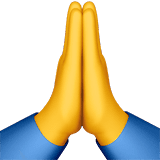

### Часть 2. 3 балла

Обучите логистическую регрессию на усредненных Word2Vec векторах. 

In [20]:
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
import gensim
plt.style.use('seaborn')

In [21]:
texts = np.hstack((df['positive'], df['negative']))

In [22]:
model = gensim.models.Word2Vec(texts, min_count = 10, window = 10, size = 200, negative = 20, workers = 4)
model.train(texts, total_examples=len(texts), epochs=5)

(11642809, 17203020)

In [23]:
def sent_to_vec(sentence, model):
  vector_words = []
  for word in sentence:
    if word in model.wv.vocab:
      vector_words.append(model.wv[word])
  if len(vector_words) == 0:
    return np.zeros(model.vector_size)
  else:
    return np.mean(vector_words, axis=0)

In [24]:
def col_to_vec(column, model, sentence_vectorizer):
  vectors = np.zeros((column.shape[0], model.vector_size))
  for j, sentence in enumerate(column):
    vectors[j, :] = sentence_vectorizer(sentence, model)
  return vectors

In [25]:
def vector(df, model, sent_to_vec):
  return np.hstack([col_to_vec(df['positive'], model, sent_to_vec), col_to_vec(df['negative'], model, sent_to_vec)])

In [26]:
X_train = vector(df_train, model, sent_to_vec)
X_test = vector(df_test, model, sent_to_vec)

In [27]:
linreg = LinearRegression()
linreg.fit(X_train, y_train)
test_preds_lin = linreg.predict(X_test)
mae(y_test, test_preds_lin)

0.9489089084290209

In [28]:
ridge.fit(X_train, y_train)
test_preds_ridge_2 = ridge.predict(X_test)
mae(y_test, test_preds_ridge_2)

0.9488948089055889

Усредняя w2v вектора, мы предполагаем, что каждое слово имеет равноценный вклад в смысл предложения, однако это может быть не совсем так. Теперь попробуйте воспользоваться другой концепцией и перевзвесить слова при получении итогового эмбеддинга текста. В качестве весов используйте IDF (Inverse document frequency)

In [29]:
keys = model.wv.vocab.keys()
idfs = dict(zip(keys, np.zeros(len(keys))))
for sentence in texts:
  for word in np.unique(sentence):
    if word in idfs.keys():
      idfs[word] += 1

values = np.array(list(idfs.values()))
idfs = dict(zip(keys, np.log(len(texts) / values)))

In [30]:
def calc_idf(texts, model):
  vector_words = []
  idf_sum = 0
  for word in texts:
    if word in model.wv.vocab:
        idf = idfs[word]
        vector_words.append(model.wv[word] * idf)
        idf_sum += idf
  if idf_sum == 0:
      return np.zeros(model.vector_size)
  else:
      return np.sum(vector_words, axis=0) / idf_sum

In [31]:
X_train = vector(df_train, model, calc_idf)
X_test = vector(df_test, model, calc_idf)

linreg.fit(X_train, y_train)
mae(y_test, linreg.predict(X_test))

0.9502753563341879

In [32]:
ridge.fit(X_train, y_train)
mae(y_test, ridge.predict(X_test))

0.9502692176022322

Проведите эксперименты с размерностью эмбеддинга. Для каждого из двух методов постройте график зависимости качества модели от размерности эмбеддинга. 
#### Сделайте выводы:

In [33]:
def val(model, sent_to_vec):
  X_train = vector(df_train, model, sent_to_vec)
  X_test = vector(df_test, model, sent_to_vec)
  linreg.fit(X_train, y_train)
  return mae(y_test, linreg.predict(X_test))

In [34]:
sizes = [100, 200, 300, 400, 500]
mean_quality = []
idf_quality = []
for size in sizes:
  model = gensim.models.Word2Vec(texts, min_count=10, window=10, size=size, negative=20, workers=4)
  model.train(texts, total_examples=len(texts), epochs=1)
  mean_quality.append(val(model, sent_to_vec))
  idf_quality.append(val(model, calc_idf))

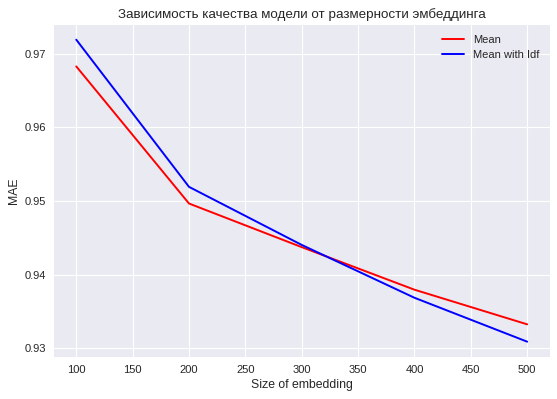

In [68]:
plt.figure(dpi=80)

plt.plot(sizes, mean_quality, label='Mean', c = 'r')
plt.plot(sizes, idf_quality, label='Mean with Idf', c= 'b')
plt.title('Зависимость качества модели от размерности эмбеддинга')
plt.xlabel('Size of embedding')
plt.ylabel('MAE')
plt.legend();

Теперь попробуйте обучить логистическую регрессию на любых других эмбеддингах размерности 300 и сравните качество с Word2Vec.

In [62]:
model_ft = gensim.models.FastText(texts, min_count=10, window=10, size=300, workers=4)
model_ft.train(texts, total_examples=len(texts), epochs=5)

In [63]:
X_train = vector(df_train, model_ft, calc_idf)
X_test = vector(df_test, model_ft, calc_idf)

linreg.fit(X_train, y_train)
mae(y_test, linreg.predict(X_test))

0.9444900967098551

In [64]:
ridge.fit(X_train, y_train)
mae(y_test, ridge.predict(X_test))

0.9507673492656744

In [65]:
model_w2v = gensim.models.Word2Vec(texts, min_count = 10, window = 10, size = 300, negative = 20, workers = 4)
model_w2v.train(texts, total_examples=len(texts), epochs=5)

(11643175, 17203020)

In [66]:
X_train = vector(df_train, model_w2v, calc_idf)
X_test = vector(df_test, model_w2v, calc_idf)

linreg.fit(X_train, y_train)
mae(y_test, linreg.predict(X_test))

0.9404995795442969

In [67]:
ridge.fit(X_train, y_train)
mae(y_test, ridge.predict(X_test))

0.9404457059371817

#### Выводы:

В целом можно сказать, что обычная линейная или ридж регрессия хорошо себя показывают. 

Причем если использовать хорошую предобработку и tf-idf, то качество даже лучше, чем на W2V. Почему? 

Я думаю, потому что даже когда мы увеличиваем размеры эмбеддингов мы не исключаем тот факт, что на вектор представление слова влияет порядок и расположение в конкретном тексте (у нас в отзыве), поэтому даже с учетом влияния инверсии частоты, с которой наше слово встречается в отзывах датасета, влияние окружения не дает существенного улучшения, но конечно же показывает себя лучше с ростом размера эмбеддинга, ведь тогда получается, что у слова появляется больше характеристик, скорректированных на инферсию частоты.

Кроме того, стоит учитывать, что отзывы в основном состоят из коротких фраз и сильного влияния окружения в конкретной фразе лучше не ожидать.

#### Тут то же самое решение я решила затестить на том же методе с объединенным столбцом (как в 1 задании). 
Учитывая то, что вроде pos и neg должны быть разными по весам, результат довольно интересный, как мне кажется :) 

In [36]:
texts_2 = np.array(df['response'])

In [37]:
model_2 = gensim.models.Word2Vec(texts_2, min_count = 10, window = 10, size = 200, negative = 20, workers = 4)
model_2.train(texts_2, total_examples=len(texts_2), epochs=5)

(11639809, 17203020)

In [38]:
X_train_2 = vector(df_train, model_2, sent_to_vec)
X_test_2 = vector(df_test, model_2, sent_to_vec)

In [39]:
linreg.fit(X_train_2, y_train)
test_preds_lin_2 = linreg.predict(X_test_2)
mae(y_test, test_preds_lin_2)

0.9452460428496537

In [40]:
ridge.fit(X_train_2, y_train)
test_preds_ridge_3 = ridge.predict(X_test_2)
mae(y_test, test_preds_ridge_3)

0.9452393717070819

In [41]:
keys = model_2.wv.vocab.keys()
idfs = dict(zip(keys, np.zeros(len(keys))))
for sentence in texts_2:
  for word in np.unique(sentence):
    if word in idfs.keys():
      idfs[word] += 1

values = np.array(list(idfs.values()))
idfs = dict(zip(keys, np.log(len(texts_2) / values)))

In [42]:
X_train_2 = vector(df_train, model_2, calc_idf)
X_test_2 = vector(df_test, model_2, calc_idf)

linreg.fit(X_train_2, y_train)
mae(y_test, linreg.predict(X_test_2))

0.9463892401631039

In [43]:
ridge.fit(X_train_2, y_train)
mae(y_test, ridge.predict(X_test_2))

0.9463870518541675

### Часть 3. 6 баллов

Теперь давайте воспользуемся более продвинутыми методами обработки текстовых данных, которые мы проходили в нашем курсе. Обучите RNN/Transformer для предсказания пользовательской оценки. Получите ошибку меньше, чем во всех вышеперечисленных методах.

Если будете обучать RNN, попробуйте ограничить максимальную длину предложения. Некоторые отзывы могут быть слишком длинные относительно остальных.

Чтобы пользоваться DataLoader, все его элементы должны быть одинаковой размерности. Для этого вы можете добавить нулевой паддинг ко всем предложениям (см пример pad_sequence)

In [ ]:
import torch
from torch import nn
from torch.nn import functional as F

In [ ]:
WORDS = set()
for sent in list(df['positive']):
    for w in sent:
        WORDS.add(w)
        
for sent in list(df['negative']):
    for w in sent:
        WORDS.add(w)

In [ ]:
int2word = dict(enumerate(tuple(WORDS)))
word2int = {w: ii for ii, w in int2word.items()}

In [ ]:
MAX_LEN = max(max(df['positive'].apply(len)), max(df['negative'].apply(len)))

In [ ]:
MAX_LEN

399

In [ ]:
from torch.nn.utils.rnn import pad_sequence

train_pos_pad = pad_sequence([torch.as_tensor([word2int[w] for w in seq][:MAX_LEN]) for seq in df_train['positive']], 
                           batch_first=True)

In [ ]:
class ReviewsDataset(torch.utils.data.Dataset):
    def __init__(self, df):
        ## TODO
        pass
        
    def __len__(self):
        ## TODO
        pass
    
    def __getitem__(self, idx):
        ## TODO
        pass

In [ ]:
BATCH_SIZE = 1

train_dataset = ReviewsDataset(df_train)
test_dataset = ReviewsDataset(df_test)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE)

In [ ]:
NUM_EPOCHS = 1

for n in range(NUM_EPOCHS):
    model.train()
    ## TODO

### Бонус. 10 баллов

Побейте качество 0.75 в [соревновании](https://www.kaggle.com/c/hseds-texts-2020/leaderboard). Можете воспользоваться вышеперечисленными методами или попробовать что-нибудь еще.

In [69]:
# Ведь 0.8294 просто на Ridge и TF-IDF это круто! :)))

# И большое спасибо за курс!